In [72]:
import pandas as pd
import seaborn as sns 
import statsmodels.api as sm
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score,cross_val_predict,GridSearchCV

import scipy.stats


In [73]:
df = pd.read_csv('listings.csv',usecols=
       ['host_since',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 
       'host_has_profile_pic', 'host_identity_verified','neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type','accommodates','bathrooms_text' ,
       'bedrooms', 'beds','amenities', 'price','number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
        'reviews_per_month','availability_30', 'availability_60', 'availability_90',
       'availability_365'])

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33259 entries, 0 to 33258
Data columns (total 30 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   host_since                                   33259 non-null  object 
 1   host_response_time                           29192 non-null  object 
 2   host_response_rate                           29192 non-null  object 
 3   host_acceptance_rate                         27328 non-null  object 
 4   host_is_superhost                            33259 non-null  object 
 5   host_has_profile_pic                         33259 non-null  object 
 6   host_identity_verified                       33259 non-null  object 
 7   neighbourhood_cleansed                       33259 non-null  object 
 8   latitude                                     33259 non-null  float64
 9   longitude                                    33259 non-null  float64
 10

In [75]:
df.columns

Index(['host_since', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review', 'last_review',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes', 'reviews_per_month'],
      dtype='object')

# Verilerin model için hazırlanması

In [76]:
df.dropna(axis='rows',inplace=True)

In [77]:
df.price = df.price.str.replace('$','')
df.price = df.price.str.replace(',','')
df.price = pd.to_numeric(df['price'])

In [78]:
df = df.query('price < 3000 ')
df.price.max()

2998.0

In [79]:
df.host_since

2        2011-04-05
3        2011-07-12
5        2011-07-16
6        2011-05-27
7        2011-05-30
            ...    
33244    2015-05-18
33245    2019-06-09
33249    2020-07-04
33252    2014-09-17
33256    2021-02-22
Name: host_since, Length: 16041, dtype: object

In [80]:
time_list = df[['host_since','first_review','last_review']]
for i in time_list:
    
    df[i] = pd.to_datetime(df[i])

In [81]:
df.host_since

2       2011-04-05
3       2011-07-12
5       2011-07-16
6       2011-05-27
7       2011-05-30
           ...    
33244   2015-05-18
33245   2019-06-09
33249   2020-07-04
33252   2014-09-17
33256   2021-02-22
Name: host_since, Length: 16041, dtype: datetime64[ns]

In [82]:
df['last_review_day']= (df.last_review.max() - df['last_review']).astype("timedelta64[D]") 
df['first_review_day']= (df.last_review.max() - df['first_review']).astype("timedelta64[D]") 
df['host_since_day']= (df.last_review.max() - df['host_since']).astype("timedelta64[D]") 

df['last-first_review_day']= (df['last_review'] - df['first_review']).astype("timedelta64[D]") 


In [83]:
df.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,...,number_of_reviews_l30d,first_review,last_review,calculated_host_listings_count,calculated_host_listings_count_entire_homes,reviews_per_month,last_review_day,first_review_day,host_since_day,last-first_review_day
2,2011-04-05,within an hour,100%,100%,f,t,t,Beyoglu,41.033190,28.980710,...,2,2011-05-17,2022-09-19,2,2,0.72,7.0,4150.0,4192.0,4143.0
3,2011-07-12,within an hour,100%,100%,f,t,t,Uskudar,41.017130,29.069570,...,0,2011-11-11,2022-08-12,2,2,0.71,45.0,3972.0,4094.0,3927.0
5,2011-07-16,within an hour,100%,94%,t,t,t,Beyoglu,41.030290,28.983150,...,2,2011-09-23,2022-09-13,4,4,0.67,13.0,4021.0,4090.0,4008.0
6,2011-05-27,within a few hours,100%,50%,f,t,t,Beyoglu,41.037261,28.991533,...,0,2012-08-28,2019-09-19,1,1,0.23,1103.0,3681.0,4140.0,2578.0
7,2011-05-30,within an hour,100%,97%,f,t,t,Beyoglu,41.036310,28.974380,...,1,2011-07-14,2022-09-02,1,1,0.38,24.0,4092.0,4137.0,4068.0


In [84]:
df.price

2        1517.0
3        1105.0
5        2047.0
6        1170.0
7         656.0
          ...  
33244     714.0
33245    1500.0
33249     400.0
33252    1070.0
33256    2447.0
Name: price, Length: 16041, dtype: float64

In [85]:
df.host_response_rate = df.host_response_rate.str.replace('%','')

df.host_acceptance_rate = df.host_acceptance_rate.str.replace('%','')

df.host_response_rate = pd.to_numeric(df['host_response_rate'])/100
df.host_acceptance_rate = pd.to_numeric(df['host_acceptance_rate'])/100


In [86]:
df.host_acceptance_rate

2        1.00
3        1.00
5        0.94
6        0.50
7        0.97
         ... 
33244    1.00
33245    1.00
33249    1.00
33252    0.82
33256    0.73
Name: host_acceptance_rate, Length: 16041, dtype: float64

In [87]:
df['amenities']

2        ["Conditioner", "Private hot tub", "Body soap"...
3        ["Window AC unit", "Hot water kettle", "Ceilin...
5        ["TV", "Kitchen", "First aid kit", "Dishes and...
6        ["Paid parking lot on premises", "Pantene ProV...
7        ["Clothing storage", "Drying rack for clothing...
                               ...                        
33244    ["Clothing storage", "Hot water kettle", "Body...
33245    ["Air conditioning", "Essentials", "Host greet...
33249    ["Patio or balcony", "Free parking on premises...
33252    ["Clothing storage", "Hot water kettle", "Kitc...
33256    ["Gas stove", "Hot water kettle", "Paid parkin...
Name: amenities, Length: 16041, dtype: object

In [88]:
df['amenities_count'] = df['amenities'][:1].str.split(',').explode().str.strip('[] ').value_counts().sum()

In [89]:
for i in range(len(df['amenities'])):
    df['amenities_count'][i-1:i] = df['amenities'][i-1:i].str.split(',').explode().str.strip('[] ').value_counts().sum()

<ipython-input-89-2487032ebde3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['amenities_count'][i-1:i] = df['amenities'][i-1:i].str.split(',').explode().str.strip('[] ').value_counts().sum()
C:\Users\TNR\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [90]:
df = df.query('amenities_count < 1000')

In [91]:
df['amenities_count']

2        38
3        54
5        21
6        46
7        27
         ..
33244    37
33245    13
33249    10
33252    34
33256    38
Name: amenities_count, Length: 16041, dtype: int64

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16041 entries, 2 to 33256
Data columns (total 35 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   host_since                                   16041 non-null  datetime64[ns]
 1   host_response_time                           16041 non-null  object        
 2   host_response_rate                           16041 non-null  float64       
 3   host_acceptance_rate                         16041 non-null  float64       
 4   host_is_superhost                            16041 non-null  object        
 5   host_has_profile_pic                         16041 non-null  object        
 6   host_identity_verified                       16041 non-null  object        
 7   neighbourhood_cleansed                       16041 non-null  object        
 8   latitude                                     16041 non-null  float64       


In [93]:
anadolu_yakası=['Atasehir','Beykoz','Adalar','Cekmekoy','Kadikoy','Kartal','Maltepe','Pendik','Sancaktepe','Sultanbeyli',
               'Sile','Tuzla','Umraniye','Uskudar']


avrupa_yakası=['Beyoglu','Sisli','Fatih','Besiktas','Esenyurt','Bagcilar','Kagithane','Sariyer','Bahcelievler','Bakirkoy',
              'Basaksehir','Kucukcekmece','Avcilar','Eyup','Kartal','Beylikduzu','Zeytinburnu','Arnavutkoy','Buyukcekmece',
              'Gaziosmanpasa','Gungoren','Bayrampasa','Silivri','Esenler','Sultangazi','Catalca']

In [94]:
neighbourhood_obj=[]

for i in df['neighbourhood_cleansed'].isin(anadolu_yakası): 
    
    if i == False :
    
        neighbourhood_obj.append('avrupa_yakası')
    
    else :
    
        neighbourhood_obj.append('anadolu_yakası')
        
    
df['neighbourhood_obj'] = neighbourhood_obj

In [95]:
df.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,...,last_review,calculated_host_listings_count,calculated_host_listings_count_entire_homes,reviews_per_month,last_review_day,first_review_day,host_since_day,last-first_review_day,amenities_count,neighbourhood_obj
2,2011-04-05,within an hour,1.0,1.00,f,t,t,Beyoglu,41.033190,28.980710,...,2022-09-19,2,2,0.72,7.0,4150.0,4192.0,4143.0,38,avrupa_yakası
3,2011-07-12,within an hour,1.0,1.00,f,t,t,Uskudar,41.017130,29.069570,...,2022-08-12,2,2,0.71,45.0,3972.0,4094.0,3927.0,54,anadolu_yakası
5,2011-07-16,within an hour,1.0,0.94,t,t,t,Beyoglu,41.030290,28.983150,...,2022-09-13,4,4,0.67,13.0,4021.0,4090.0,4008.0,21,avrupa_yakası
6,2011-05-27,within a few hours,1.0,0.50,f,t,t,Beyoglu,41.037261,28.991533,...,2019-09-19,1,1,0.23,1103.0,3681.0,4140.0,2578.0,46,avrupa_yakası
7,2011-05-30,within an hour,1.0,0.97,f,t,t,Beyoglu,41.036310,28.974380,...,2022-09-02,1,1,0.38,24.0,4092.0,4137.0,4068.0,27,avrupa_yakası


In [96]:
df.corr()

,host_response_rate,host_acceptance_rate,latitude,longitude,accommodates,bedrooms,beds,price,availability_30,availability_60,...,number_of_reviews_ltm,number_of_reviews_l30d,calculated_host_listings_count,calculated_host_listings_count_entire_homes,reviews_per_month,last_review_day,first_review_day,host_since_day,last-first_review_day,amenities_count
host_response_rate,1.000000,0.365061,-0.014644,0.007432,0.061690,-0.038886,-0.012880,0.095723,-0.107040,-0.065628,...,0.159001,0.191086,0.087046,0.091354,0.203780,-0.273986,-0.048084,0.015078,0.065062,0.169309
host_acceptance_rate,0.365061,1.000000,-0.016050,-0.025144,0.076738,-0.018775,0.012517,0.129468,-0.069756,-0.040859,...,0.227204,0.225754,0.119707,0.113969,0.272134,-0.356124,-0.115451,-0.082456,0.027329,0.121006
latitude,-0.014644,-0.016050,1.000000,-0.163582,0.067226,0.008044,0.026447,0.088094,0.025104,0.021683,...,-0.018572,-0.024627,0.046257,0.053978,-0.026216,0.013542,-0.007138,-0.000204,-0.013500,0.001275
longitude,0.007432,-0.025144,-0.163582,1.000000,-0.042676,0.006448,-0.040777,0.008737,-0.002697,-0.015632,...,0.016715,0.029834,-0.022526,-0.021139,0.031541,-0.017733,0.007307,0.034167,0.015474,0.001747
accommodates,0.061690,0.076738,0.067226,-0.042676,1.000000,0.459350,0.603505,0.488766,0.002875,0.012955,...,0.077463,0.047703,0.033834,0.067390,0.065639,-0.043996,0.024380,0.032283,0.045147,0.152088
bedrooms,-0.038886,-0.018775,0.008044,0.006448,0.459350,1.000000,0.624166,0.225829,0.011471,0.006364,...,-0.008500,-0.005662,0.003218,0.020527,-0.008977,-0.006248,-0.002624,0.000252,-0.000167,0.052100
beds,-0.012880,0.012517,0.026447,-0.040777,0.603505,0.624166,1.000000,0.233402,0.040951,0.037493,...,0.004347,-0.012698,-0.039632,-0.025101,-0.019762,0.006544,0.033809,-0.004511,0.033750,0.077114
price,0.095723,0.129468,0.088094,0.008737,0.488766,0.225829,0.233402,1.000000,0.111846,0.114759,...,0.100658,0.023144,0.186720,0.193714,0.046728,-0.000354,0.045688,0.111785,0.049536,0.191124
availability_30,-0.107040,-0.069756,0.025104,-0.002697,0.002875,0.011471,0.040951,0.111846,1.000000,0.913401,...,-0.170513,-0.122419,-0.010283,-0.028562,-0.117754,0.056917,-0.095798,-0.144425,-0.127863,-0.082270
availability_60,-0.065628,-0.040859,0.021683,-0.015632,0.012955,0.006364,0.037493,0.114759,0.913401,1.000000,...,-0.127238,-0.070209,0.001546,-0.012144,-0.070694,0.013482,-0.104949,-0.141841,-0.119201,-0.045834


<AxesSubplot:>

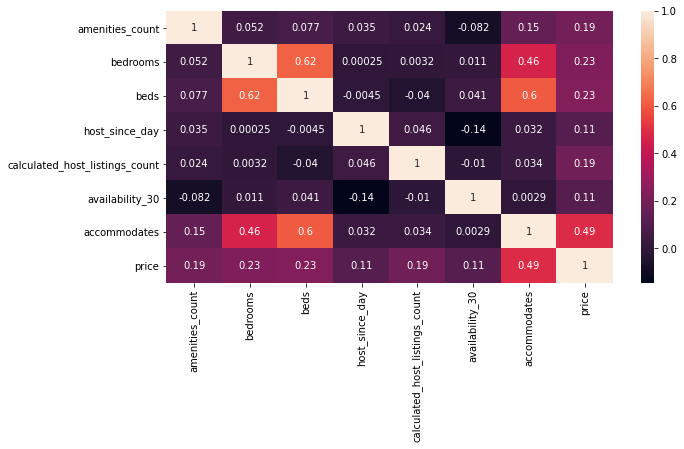

In [97]:
fig, ax = plt.subplots(figsize=(10,5)) 

sns.heatmap(df[['amenities_count', 'bedrooms','beds',
       'host_since_day','calculated_host_listings_count','availability_30', 
       'accommodates','price']].corr(),annot = True, ax=ax)

# EDA

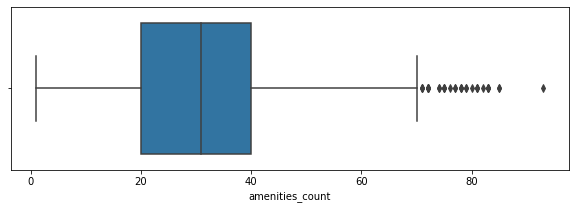

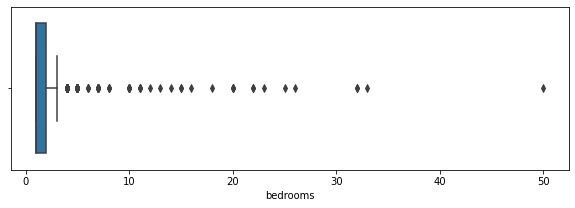

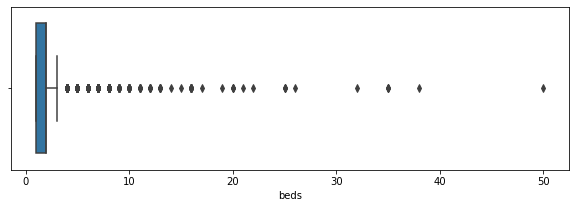

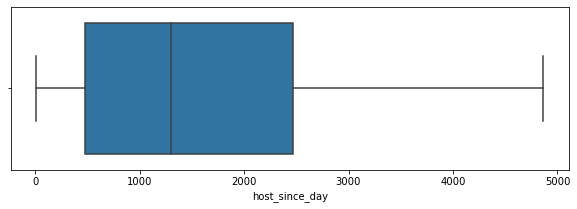

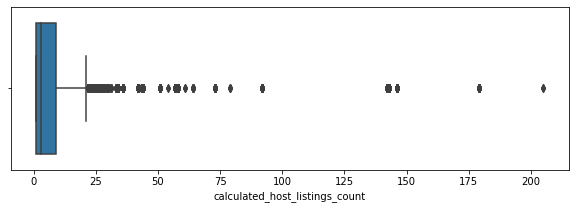

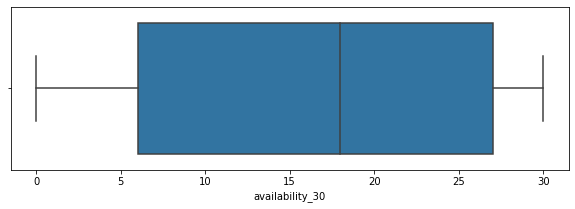

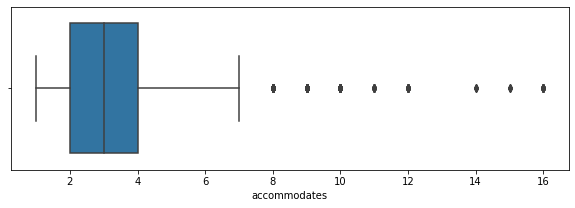

In [98]:
numeric_list = ['amenities_count', 'bedrooms','beds',
       'host_since_day','calculated_host_listings_count','availability_30', 
       'accommodates']

for i in numeric_list:
    plt.figure(figsize=(10,3))
    sns.boxplot(x=df[i])

In [99]:
def ktest(col):
        
       
        stat, p = scipy.stats.kstest(df[col], cdf='norm')
        print(col)
        print('Test İstatistiği: %.3f, p-değeri: %.3f'%(test_stat, p_val))
        
        alpha = 0.05
        if p > alpha:
             print('Veri Normal dağılımlıdır.')
        else:
       
            print('Veri Normal dağılımlı değildir.')
        print('...................................')


 


In [100]:
import scipy.stats
test_stat, p_val = scipy.stats.kstest(df['price'], cdf='norm')
print('Test İstatistiği: %.3f, p-değeri: %.3f'%(test_stat, p_val))
alfa = 0.05
if p_val > alfa:
 print('Veri Normal dağılımlıdır.')
else:
 print('Veri Normal dağılımlı değildir.')

Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.


In [101]:
import scipy.stats

for i in numeric_list:
    ktest(i)

amenities_count
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
bedrooms
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
beds
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
host_since_day
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
calculated_host_listings_count
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
availability_30
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................
accommodates
Test İstatistiği: 1.000, p-değeri: 0.000
Veri Normal dağılımlı değildir.
...................................


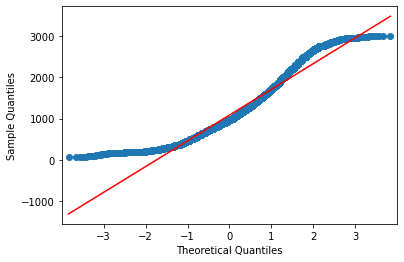

In [102]:
from statsmodels.graphics.gofplots import qqplot
qqplot(df['price'],line='s');

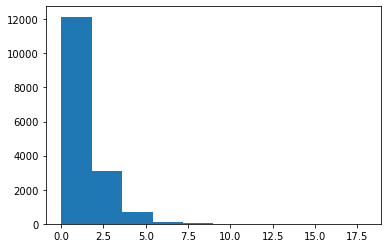

In [103]:
plt.hist(df['reviews_per_month']);

In [104]:
df.columns

Index(['host_since', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review', 'last_review',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes', 'reviews_per_month',
       'last_review_day', 'first_review_day', 'host_since_day',
       'last-first_review_day', 'amenities_count', 'neighbourhood_obj'],
      dtype='object')

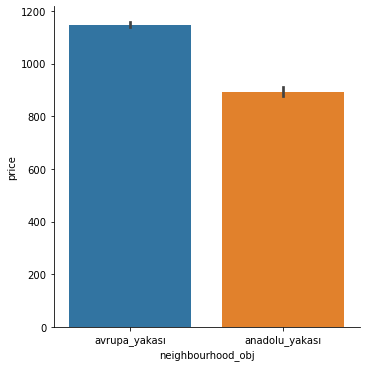

In [105]:
sns.catplot(x="neighbourhood_obj", y="price", kind="bar", data=df);

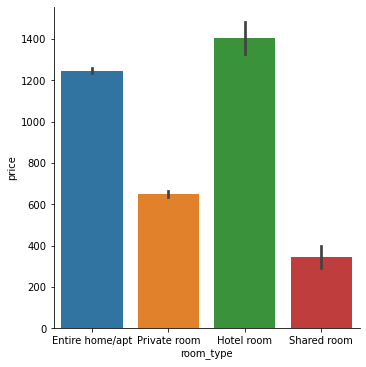

In [106]:
sns.catplot(x="room_type", y="price", kind="bar", data=df);

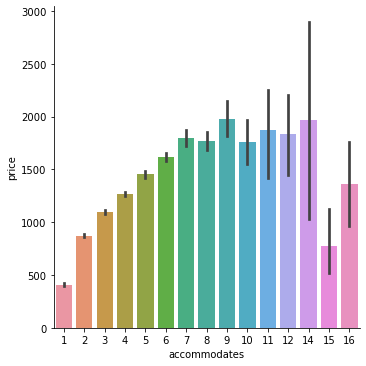

In [107]:
sns.catplot(x="accommodates", y="price", kind="bar", data=df);

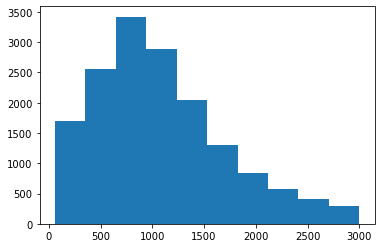

In [108]:
plt.hist(df.price);

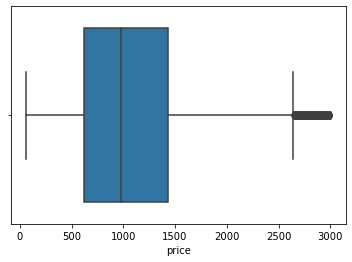

In [109]:
sns.boxplot(x=df.price);

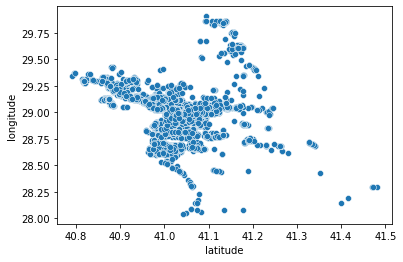

In [110]:
sns.scatterplot(x=df.latitude,y=df.longitude);

In [44]:
#!pip install folium

In [45]:
import folium
from folium.plugins import MarkerCluster


In [77]:
city_pos = [df.latitude.mean(),df.longitude.mean()]


In [4]:
# Create the map
"""istanbul = folium.Map(location=city_pos, tiles='cartodbpositron', zoom_start=10)

location=df[["latitude","longitude"]]

MarkerCluster(location).add_to(istanbul)

istanbul"""

'istanbul = folium.Map(location=city_pos, tiles=\'cartodbpositron\', zoom_start=10)\n\nlocation=df[["latitude","longitude"]]\n\nMarkerCluster(location).add_to(istanbul)\n\nistanbul'

In [3]:
"""heat_data=list(zip(df.latitude, df.longitude))
folium.plugins.HeatMap(heat_data).add_to(istanbul)
istanbul"""


'heat_data=list(zip(df.latitude, df.longitude))\nfolium.plugins.HeatMap(heat_data).add_to(istanbul)\nistanbul'

In [1]:
"""m = folium.Map([42 ,29], zoom_start=5,width="%100",height="%100")
locations = list(zip(df.latitude, df.longitude))
cluster = MarkerCluster(locations=locations,                     
               popups=df["neighbourhood_cleansed"].tolist()) #ilçe adlarını görmek için.
m.add_child(cluster)
m"""

'm = folium.Map([42 ,29], zoom_start=5,width="%100",height="%100")\nlocations = list(zip(df.latitude, df.longitude))\ncluster = MarkerCluster(locations=locations,                     \n               popups=df["neighbourhood_cleansed"].tolist()) #ilçe adlarını görmek için.\nm.add_child(cluster)\nm'

In [2]:

"""m = folium.Map(location=[41,29],width="%100",height="%100")
for i in range(len(locations)):
    folium.CircleMarker(location=locations[i],radius=1).add_to(m)
m"""

'm = folium.Map(location=[41,29],width="%100",height="%100")\nfor i in range(len(locations)):\n    folium.CircleMarker(location=locations[i],radius=1).add_to(m)\nm'

In [82]:
min_price=df["price"].min()
 
max_price=df["price"].max()

In [83]:
import branca.colormap as cm

In [86]:
m = folium.Map(location=[41,29],width="%100",height="%100")
colormap = cm.StepColormap(colors=['green','red'] ,#renkler
                           index=[min_price,1500,max_price], #eşik değerler
                           vmin= min_price,
                           vmax=max_price)

for loc, p in zip(zip(df["latitude"],df["longitude"]),df["price"]):
      folium.Circle(
      location=loc,
      radius=2, #yarıçap
      fill=True, #içi dolu çember
      color=colormap(p)

).add_to(m)

m

# Model

## Linear regresyon

In [111]:
X = df[['amenities_count', 'bedrooms','beds',
       'host_since_day','calculated_host_listings_count','availability_30', 
       'accommodates']]
y=df['price']

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)


In [113]:
X_c = sm.add_constant(X_train)
LR_OLS = sm.OLS(y_train,X_c)
LR_OLS_results = LR_OLS.fit()
LR_OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.315
Model:                            OLS   Adj. R-squared:                  0.315
Method:                 Least Squares   F-statistic:                     843.3
Date:                Fri, 06 Jan 2023   Prob (F-statistic):               0.00
Time:                        18:21:45   Log-Likelihood:                -98378.
No. Observations:               12832   AIC:                         1.968e+05
Df Residuals:                   12824   BIC:                         1.968e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             90.5149     17.056      5.307      0.000      57.082     123.947
amenities_count                    5.6287      0.340     16.578      0.000       4.963       6.294
bedrooms                          50.9270      6.323      8.054      0.000      38.533      63.321
beds                             -52.1500      4.317    -12.081      0.000     -60.612     -43.688
host_since_day                     0.0578      0.004     13.965      0.000       0.050       0.066
calculated_host_listings_count     3.8686      0.177     21.918      0.000       3.523       4.215
availability_30                    8.1743      0.424     19.269      0.000       7.343       9.006
accommodates                     182.0614      3.419     53.250      0.000     175.360     188.763
==============================================================================
Omnibus:                     1187.222   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1929.613
Skew:                           0.682   Prob(JB):                         0.00
Kurtosis:                       4.322   Cond. No.                     7.06e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.06e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

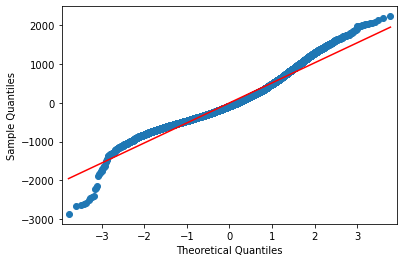

In [114]:
artık = LR_OLS_results.resid
sm.qqplot(artık, line='s')
plt.show()

In [115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['Değişken'] = X.columns
vif

,VIF,Değişken
0,4.278469,amenities_count
1,4.548926,bedrooms
2,5.256436,beds
3,2.444753,host_since_day
4,1.177148,calculated_host_listings_count
5,2.529809,availability_30
6,6.938359,accommodates


In [ ]:
#çoklu bağlantı problemi var.

In [67]:
categorical_list = ['host_identity_verified','host_is_superhost','property_type', 'room_type',
        
        'host_response_time','neighbourhood_obj']

for i in categorical_list:
    print(df.groupby(i)['price'].mean())

host_identity_verified
f    1006.607928
t    1097.226376
Name: price, dtype: float64
host_is_superhost
f    1044.291911
t    1206.628971
Name: price, dtype: float64
property_type
Boat                                 1497.333333
Camper/RV                            1349.400000
Campsite                              300.000000
Casa particular                      1098.500000
Earthen home                          921.000000
                                        ...     
Shared room in ryokan                 147.000000
Shared room in serviced apartment     223.500000
Shared room in tiny home             1071.000000
Tiny home                            1045.115385
Treehouse                            1398.444444
Name: price, Length: 65, dtype: float64
room_type
Entire home/apt    1247.438005
Hotel room         1405.088353
Private room        650.328085
Shared room         343.450382
Name: price, dtype: float64
host_response_time
a few days or more     825.638249
within a day           932.

## Karar Ağaçları

In [116]:
X = df[['host_identity_verified','host_is_superhost','property_type', 'room_type',
        
        'bedrooms','beds','calculated_host_listings_count', 'host_since_day',
        
        'latitude','longitude', 'number_of_reviews_ltm','amenities_count','accommodates','reviews_per_month','host_response_time',
        
        'availability_30', 'availability_60', 'availability_90',
       
        'host_acceptance_rate','neighbourhood_obj']]

y=df['price']

In [117]:
dms = pd.get_dummies(df[['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
                        'neighbourhood_obj']])
X_ = X.drop(['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
            'neighbourhood_obj'],axis = 1)
X=pd.concat([X_,dms],axis=1)

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)


In [119]:
cart_model = DecisionTreeRegressor(max_depth=2).fit(X_train,y_train)


In [120]:
 y_pred = cart_model.predict(X_test)

In [121]:
print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))

RMSE  : 528.3290232446996
r2_score :  0.27278871874874544


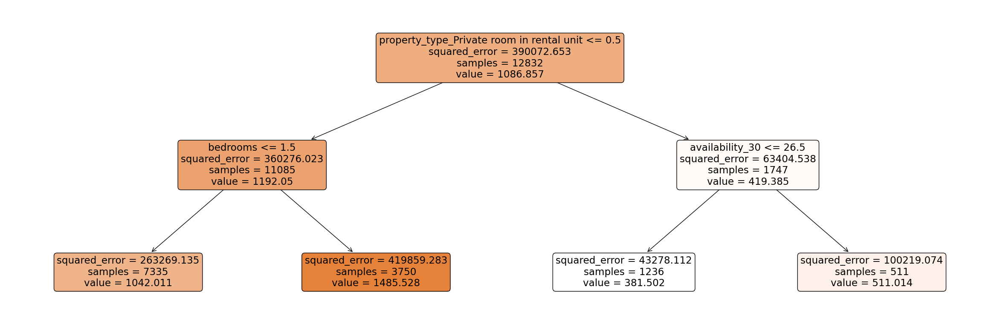

In [122]:
from sklearn import tree
plt.figure(figsize=(30,10), dpi  = 100)
tree.plot_tree(cart_model,
               feature_names= X.columns,
              rounded = True,
              filled = True,
              impurity = True);

In [124]:
cart_model = DecisionTreeRegressor().fit(X_train,y_train)

y_pred = cart_model.predict(X_test)

print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))

RMSE  : 555.4180464252092
r2_score :  0.19630430349230754


<AxesSubplot:>

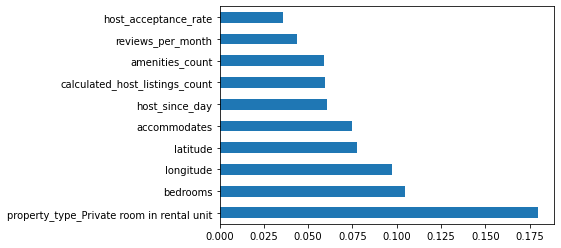

In [125]:
feature_importance = pd.Series(cart_model.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")

## Random Forest

In [58]:
params = {    
                "min_samples_split" : [2,10],
                "n_estimators": [100,500]
         } 

model_cv = GridSearchCV(RandomForestRegressor(random_state=42), params, cv=3,verbose=2)

model_tuned = model_cv.fit(X_train, y_train)
            
print(model_tuned.best_params_)       

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] END ..............min_samples_split=2, n_estimators=100; total time=  10.7s
[CV] END ..............min_samples_split=2, n_estimators=100; total time=  11.1s
[CV] END ..............min_samples_split=2, n_estimators=100; total time=  10.8s
[CV] END ..............min_samples_split=2, n_estimators=500; total time=  56.7s
[CV] END ..............min_samples_split=2, n_estimators=500; total time= 1.0min
[CV] END ..............min_samples_split=2, n_estimators=500; total time= 1.2min
[CV] END .............min_samples_split=10, n_estimators=100; total time=  10.3s
[CV] END .............min_samples_split=10, n_estimators=100; total time=  10.2s
[CV] END .............min_samples_split=10, n_estimators=100; total time=  10.1s
[CV] END .............min_samples_split=10, n_estimators=500; total time=  54.8s
[CV] END .............min_samples_split=10, n_estimators=500; total time=  48.7s
[CV] END .............min_samples_split=10, n_est

In [60]:
regr = RandomForestRegressor(random_state=42,min_samples_split=2,n_estimators=500).fit(X_train, y_train)


y_pred = regr.predict(X_test)
print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))

RMSE  : 384.24509790936054
r2_score :  0.6153476935367855


<AxesSubplot:>

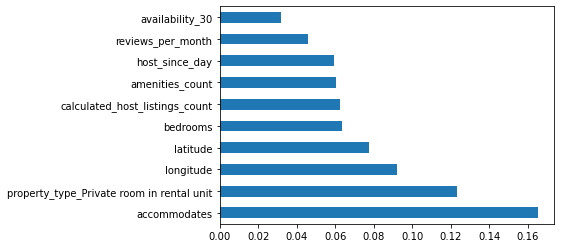

In [62]:
feature_importance = pd.Series(regr.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")

In [95]:
 print(df.groupby('property_type')['price'].mean())

property_type
Boat                                 1497.333333
Camper/RV                            1349.400000
Campsite                              300.000000
Casa particular                      1098.500000
Earthen home                          921.000000
                                        ...     
Shared room in ryokan                 147.000000
Shared room in serviced apartment     223.500000
Shared room in tiny home             1071.000000
Tiny home                            1045.115385
Treehouse                            1398.444444
Name: price, Length: 64, dtype: float64


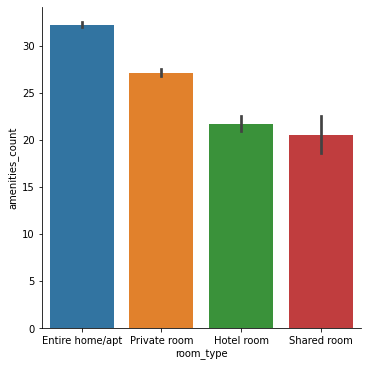

In [136]:
sns.catplot(x="room_type", y="amenities_count", kind="bar", data=df);

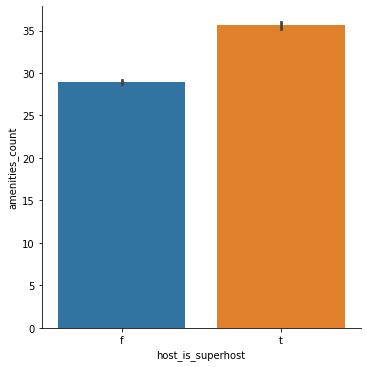

In [221]:
sns.catplot(x="host_is_superhost", y="amenities_count", kind="bar", data=df);

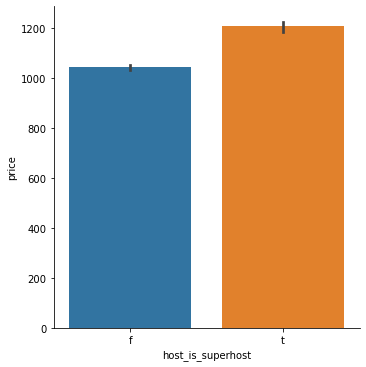

In [100]:
sns.catplot(x="host_is_superhost", y="price", kind="bar", data=df);

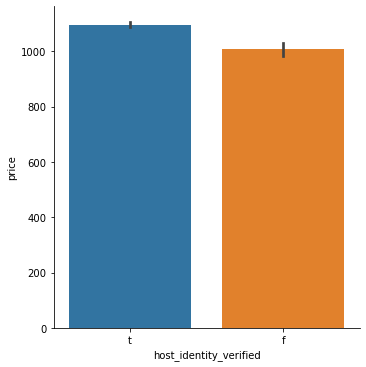

In [102]:
sns.catplot(x="host_identity_verified", y="price", kind="bar", data=df);

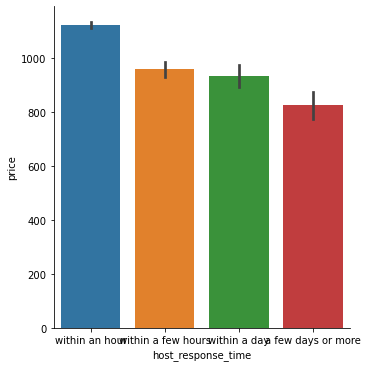

In [71]:
sns.catplot(x="host_response_time", y="price", kind="bar", data=df);


# Sunumdan sonra eklenen kısım

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16041 entries, 2 to 33256
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   host_since                                   16041 non-null  datetime64[ns]
 1   host_response_time                           16041 non-null  object        
 2   host_response_rate                           16041 non-null  float64       
 3   host_acceptance_rate                         16041 non-null  float64       
 4   host_is_superhost                            16041 non-null  object        
 5   host_has_profile_pic                         16041 non-null  object        
 6   host_identity_verified                       16041 non-null  object        
 7   neighbourhood_cleansed                       16041 non-null  object        
 8   latitude                                     16041 non-null  float64       


# Beyoğlu 

In [51]:
df_bey = df.query('neighbourhood_cleansed == "Beyoglu"')

In [52]:
df_bey.neighbourhood_cleansed

2        Beyoglu
5        Beyoglu
6        Beyoglu
7        Beyoglu
10       Beyoglu
          ...   
33055    Beyoglu
33153    Beyoglu
33224    Beyoglu
33237    Beyoglu
33245    Beyoglu
Name: neighbourhood_cleansed, Length: 4647, dtype: object

## Linear regresyon

In [53]:
X = df_bey[['amenities_count', 'bedrooms','beds',
       'host_since_day','calculated_host_listings_count','availability_30', 
       'accommodates']]
y=df_bey['price']

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)


In [55]:
X_c = sm.add_constant(X_train)
LR_OLS = sm.OLS(y_train,X_c)
LR_OLS_results = LR_OLS.fit()
LR_OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.315
Method:                 Least Squares   F-statistic:                     245.4
Date:                Fri, 06 Jan 2023   Prob (F-statistic):          6.97e-301
Time:                        17:41:36   Log-Likelihood:                -28464.
No. Observations:                3717   AIC:                         5.694e+04
Df Residuals:                    3709   BIC:                         5.699e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            131.3660     33.507      3.921      0.000      65.673     197.060
amenities_count                   10.4082      0.694     14.993      0.000       9.047      11.769
bedrooms                         165.6168     16.846      9.831      0.000     132.589     198.645
beds                             -74.7829      8.651     -8.645      0.000     -91.744     -57.822
host_since_day                     0.0260      0.007      3.618      0.000       0.012       0.040
calculated_host_listings_count     2.9793      0.296     10.057      0.000       2.399       3.560
availability_30                    8.5581      0.860      9.955      0.000       6.873      10.244
accommodates                     150.9524      7.821     19.300      0.000     135.618     166.287
==============================================================================
Omnibus:                      288.929   Durbin-Watson:                   2.030
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              397.694
Skew:                           0.653   Prob(JB):                     4.38e-87
Kurtosis:                       3.928   Cond. No.                     8.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Karar Ağaçları

In [58]:
X = df_bey[['host_identity_verified','host_is_superhost','property_type', 'room_type',
        
        'bedrooms','beds','calculated_host_listings_count', 'host_since_day',
        
        'latitude','longitude', 'number_of_reviews_ltm','amenities_count','accommodates','reviews_per_month','host_response_time',
        
        'availability_30', 'availability_60', 'availability_90',
       
        'host_acceptance_rate']]

y=df_bey['price']

In [59]:
dms = pd.get_dummies(df_bey[['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
                        ]])
X_ = X.drop(['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
            ],axis = 1)
X=pd.concat([X_,dms],axis=1)

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)


In [61]:
cart_model = DecisionTreeRegressor().fit(X_train,y_train)

y_pred = cart_model.predict(X_test)

print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))


RMSE  : 552.7143490202722
r2_score :  0.251622665061765


<AxesSubplot:>

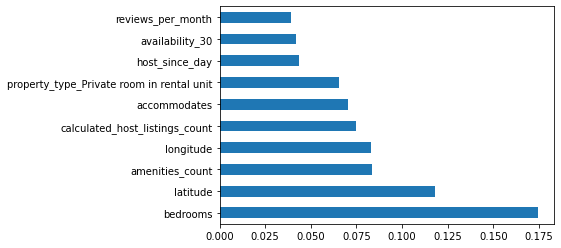

In [62]:
feature_importance = pd.Series(cart_model.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")

## Random Forest

In [63]:
regr = RandomForestRegressor(random_state=42,min_samples_split=2,n_estimators=500).fit(X_train, y_train)


y_pred = regr.predict(X_test)
print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))

RMSE  : 396.65868675621016
r2_score :  0.61456328021566


<AxesSubplot:>

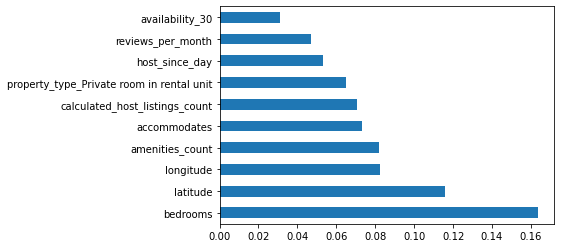

In [64]:
feature_importance = pd.Series(regr.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")

# Kadıköy

In [67]:
df_kd = df.query('neighbourhood_cleansed == "Kadikoy"')

## Linear regresyon

In [69]:
X = df_kd[['amenities_count', 'bedrooms','beds',
       'host_since_day','calculated_host_listings_count','availability_30', 
       'accommodates']]
y=df_kd['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)


X_c = sm.add_constant(X_train)
LR_OLS = sm.OLS(y_train,X_c)
LR_OLS_results = LR_OLS.fit()
LR_OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.403
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     156.4
Date:                Fri, 06 Jan 2023   Prob (F-statistic):          1.22e-176
Time:                        17:49:50   Log-Likelihood:                -12081.
No. Observations:                1631   AIC:                         2.418e+04
Df Residuals:                    1623   BIC:                         2.422e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -34.8051     35.837     -0.971      0.332    -105.097      35.487
amenities_count                    4.7707      0.714      6.677      0.000       3.369       6.172
bedrooms                          70.3534     13.201      5.329      0.000      44.460      96.247
beds                             -31.6140     12.783     -2.473      0.013     -56.688      -6.540
host_since_day                     0.0239      0.009      2.615      0.009       0.006       0.042
calculated_host_listings_count     3.0885      0.495      6.238      0.000       2.117       4.060
availability_30                    6.6430      0.903      7.356      0.000       4.872       8.414
accommodates                     194.6620      8.672     22.448      0.000     177.653     211.671
==============================================================================
Omnibus:                      298.639   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              804.416
Skew:                           0.963   Prob(JB):                    2.11e-175
Kurtosis:                       5.851   Cond. No.                     6.75e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.75e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Karar Ağaçları

RMSE  : 435.9932035358026
r2_score :  0.3090763134961815


<AxesSubplot:>

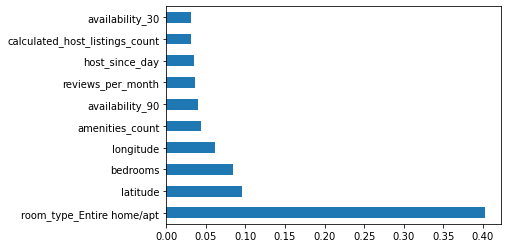

In [70]:
X = df_kd[['host_identity_verified','host_is_superhost','property_type', 'room_type',
        
        'bedrooms','beds','calculated_host_listings_count', 'host_since_day',
        
        'latitude','longitude', 'number_of_reviews_ltm','amenities_count','accommodates','reviews_per_month','host_response_time',
        
        'availability_30', 'availability_60', 'availability_90',
       
        'host_acceptance_rate']]

y=df_kd['price']


dms = pd.get_dummies(df_kd[['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
                        ]])
X_ = X.drop(['host_is_superhost','property_type', 'room_type','host_identity_verified','host_response_time',
            ],axis = 1)
X=pd.concat([X_,dms],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)

cart_model = DecisionTreeRegressor().fit(X_train,y_train)

y_pred = cart_model.predict(X_test)

print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))


feature_importance = pd.Series(cart_model.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")

## Random Forest

RMSE  : 310.9920082615137
r2_score :  0.6484645715585811


<AxesSubplot:>

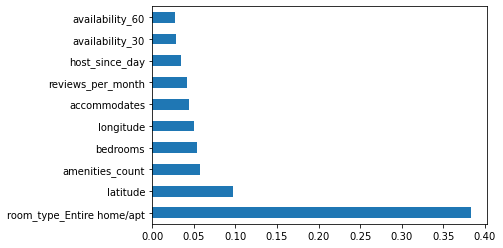

In [71]:
regr = RandomForestRegressor(random_state=42,min_samples_split=2,n_estimators=500).fit(X_train, y_train)


y_pred = regr.predict(X_test)
print( "RMSE  :", np.sqrt(mean_squared_error(y_test, y_pred)))
            
print("r2_score : " , r2_score(y_test, y_pred))

feature_importance = pd.Series(regr.feature_importances_,
                          index=X_train.columns)
feature_importance.nlargest(10).plot(kind= "barh")